<a href="https://colab.research.google.com/github/ktichola/Image-matching/blob/main/IMC_2024_Rotation_correction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'image-matching-challenge-2024:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-competitions-data%2Fkaggle-v2%2F71885%2F8143495%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240514%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240514T080024Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D4ce1e7b11238a90c7998a2fbc1f7507e6316237cdb7549c16d1b9759f70f2a4693353596cc8db4346c62150f33f4ae5693c25054cf6b49176575353204a5383e253b857f9e31f75fb14f422fba7f68ef88ec86bc59e9efa9645b257bbcce3cb6a7bd5e49ea97998a40a0e20be15b266d8413f08ad609d559a3e987eedcab964d0cbcf503e49bf8124f28ca32dd745178a0430f45652009141ad94a8f26325b81333c62908c2bef8e130af86371e9d89328599ced193a44aa4d42a5dc0714e97094861604790d3d0d2cc59071056aac9f4e1586148ac8718967ed4ecf2f2508dd00d5fa9086b4d41a015b66cb24951fd859fab4b4ccf46b1df060b4d82195fdf6,mediapy:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4973903%2F8367334%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240514%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240514T080024Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D496373faac0bd8e29ab8b19e3f2ea34b3d1f07cf23f142cf615838bf0b529524f348bd74e49d856b125459356f6c63d9feccfd0d6db1c45ae550e7200b4c7ffdf6131ab0f049fe46f895ad324de8f8422dc8cdb0f256778a91e94a6b29c776703a72484609eadac2d4b23f2ae3cfba1d0225f991655780ffdb55916fd45e81a20aead27717f74b6c3be8e6635b1546e87833ad2f578c0c5ca3e38fa6882d4ed14d2c791c3f36b5311d2c57b03dce0826ff7dcf530103ee26bead5dd87f0defb59c9c0819bbc415daa2a67b4b7ff018ce3ebd1f81b6032c3b984f88102c15cf734a9519c5a6f009a42d95acc1627d70004154216a6efe57f4a182b1bbd842fa80,check-orientation:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4974117%2F8367624%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240514%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240514T080024Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3Dac6944540d3c1cfeccb19c8377672f6ea905744c638e27960191d16d2d0a5a3a8f6ccf01254b79bb4868fd4b5b2bd4a58a2fbdd0274cf041855437b83d2517db0e9d46289bf0fec85fab06fe1061afe06395466b494fed4fe9c8af9116714326c1f083b1081ecaa370b2bf3fa4a7165bfbc1f6ba5b23c95324b13b610ef5bef29b4faff6a3425065cbe0994f18cd335d8d22b3d99cac1b54889646d1fb59e57b6f07c1c7cad1b7a9078c3af6b546f10732ea8e5a07e4aefd54aa016b845e54f3c72b173bd58b4586417c124cdddd6a88518a783fc2b7d4c520f4b8d4afea3947aa58cf5cba534499970fd5f19b2358b0851e6d001c00e5e012a917112a192c62,orientation-prediction:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4974104%2F8368028%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240514%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240514T080024Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D26733b0726dcd03563981cd4929ac9c2f0ecba29ee9fc7964734d6700605321990954cfd6bdb189e198a8fb64144c89fef44818a46598d81ca62f65e9dff84c66f68632bd4dd2ddbe25c4d4b17edf1d983d3155b46a43eb11304fbcf1b3f06537a536272ced570409c8222a6928c886546284403f2b0d58b3b983fb03e95d46e1582634dbd50285520283da5b776e65fc1bf4b2e5b2f91ccd225ede989e05b8acb18d6f2131d56bdcaa9ab95cb8887f01c99ecdf883705e8d94d123a03ae1c207621148012b323552a42100a6138755e307af599158047145ecbac02f6bd57614e71c660bb32bd4457c58c94ba614d867d5c74e3192b99228600691fb2188919,checkorientation:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4974284%2F8368095%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240514%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240514T080024Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D4185603a83c0775dc2699066296f71932d9526696c20324849498ac8308b5460408fd8596c12b455d30a71f8b7fe825a64802b19ee333e9e93fd9e15bac44300a696cc7adfe83eb1374a806bf540f8d1dc72c7d0dee2f152c713cbdc2fc3909c8e86df9dc41f5627db4cbbf93a998b3888ce19f07ec68712651e6a5518b8bf5fd1cfdad279e2c52b1b0978d6141c690731e745b53f5acf2adfaaa150b8705971b2ddf37bf651e29b9f629edbb53a4037a3d892205e55378704c1d63caecf940818cd1e48e96cb308b69ae11793bb8c78fc7e21f26f6ebae2c9c821cb73b6479f3475e0de06ba3985c78748e987a26c9aa9d5f5c8c756db39de36baeee32f59de,swsl_resnext50_32x4d/pytorch/v1/1:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-models-data%2F38394%2F45794%2Fbundle%2Farchive.tar.gz%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240514%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240514T080025Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D74abeea3dbd9d79d3834bee4bf1d2dc19565a95386df5637571b65c6282afff3862ca22b1ba1fbb0cca8ee2131c31f46321834c033e42afdf8f4c230fed54a00537d7461dba558d6be7e04957512522e5f8a0731728514fec23bf46fc0faac2b0f70d1a70481166e12b2491f4b57a950e4aa5b8d6d744de8c03fc3647ff77b231768eb8af66b92321a632eabcfc2cf1d0c497b71c0db5f6fd74436ea410ed133781deb8433eedbb2cbe1369eb4dfbee07471006f4be136692abca814e4e37680dba19b5ee34de12bbab447bcb9cb3b9d7432e0acaaf65fba679d76c300ed9582573b43cbb6534acc8d6b58e6438f60f4ee6f8d64af0e4d70f31c072fb272e0b8'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


# Introduction
In this note book, I try implementing part of the solution gaining the [2nd position at IMC2023](https://www.kaggle.com/competitions/image-matching-challenge-2023/discussion/416873). The authors had used this [solution](https://github.com/ternaus/check_orientation) to correct rotated images before using it in the rest of the pipeline.

This notebook allows user to explore the dataset of choice. Then run the rotation correction and visualize the outputs.

# Import Dependencies

In [ ]:
!pip install --no-index --find-links=/kaggle/input/mediapy/mediapy mediapy
!pip install --no-index /kaggle/input/check-orientation/check-orientation/iglovikov_helper_functions-0.0.53-py2.py3-none-any.whl --no-deps

import os
import numpy as np
import mediapy as media
import cv2
from glob import glob
from pathlib import Path
from time import time
from pprint import pprint
import os
import shutil
import torch
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from collections import namedtuple
from typing import Optional
from iglovikov_helper_functions.dl.pytorch.utils import rename_layers
from timm import create_model as timm_create_model
from torch import nn


Looking in links: /kaggle/input/mediapy/mediapy
Processing /kaggle/input/mediapy/mediapy/mediapy-1.2.0-py3-none-any.whl
Processing /kaggle/input/check-orientation/check-orientation/iglovikov_helper_functions-0.0.53-py2.py3-none-any.whl


In [ ]:
DEBUG = True;

# Copy Work Directory
Create a new working directory to work with.


In [ ]:
# Source and destination paths
source_path = "/kaggle/input/image-matching-challenge-2024"
destination_path = "/kaggle/working/image-matching-challenge-2024"

if not os.path.exists(destination_path):
    shutil.copytree(source_path, destination_path)
    print("Directory copied successfully!")
else:
    print("Destination directory already exists. Skipping the copying process.")

Directory copied successfully!


In [ ]:
# Uses this section for testing
# Use the dioscuri together with church as church dont have any disoriented photos

if DEBUG:
    # Source and destination directories
    source_dir = "/kaggle/working/image-matching-challenge-2024/train/dioscuri/images"
    destination_dir = "/kaggle/working/image-matching-challenge-2024/test/dioscuri/images"

    # Remove the existing destination directory
    #shutil.rmtree(destination_dir)

    # Copy the entire directory tree from source to destination
    shutil.copytree(source_dir, destination_dir)

    print("Directory replaced successfully.")

Directory replaced successfully.


# Import Check Orientation model
Input an image

Output a prediction in 4 rotation class [0deg 90deg 180deg 270deg]

using the MODELS at /kaggle/input/swsl_resnext50_32x4d/pytorch/v1/1

In [ ]:
def create_model(model_name: str, activation: Optional[str] = "softmax") -> nn.Module:
    # Define the 'model' namedtuple
    model = namedtuple("model", ["url", "model"])

    # Define the models dictionary
    models = {
        "swsl_resnext50_32x4d": model(
            model=timm_create_model("swsl_resnext50_32x4d", pretrained=False, num_classes=4),
            url="/kaggle/input/swsl_resnext50_32x4d/pytorch/v1/1/2020-11-16_resnext50_32x4d.pth",
        ),
    }

    # Load the model from models dictionary
    model = models[model_name].model

    # Load the model state dictionary from local path
    state_dict = torch.load(models[model_name].url, map_location="cpu")["state_dict"]
    state_dict = rename_layers(state_dict, {"model.": ""})
    # Load the state dictionary into the model
    model.load_state_dict(state_dict)

    if activation == "softmax":
        return nn.Sequential(model, nn.Softmax(dim=1))

    return model

In [ ]:
model = create_model("swsl_resnext50_32x4d")
model.eval()

/opt/conda/lib/python3.10/site-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name swsl_resnext50_32x4d to current resnext50_32x4d.fb_swsl_ig1b_ft_in1k.
  model = create_fn(


Sequential(
  (0): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act1): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act1): ReLU(inplace=True)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop_block): Identity()
        (act2): ReLU(inplace=True)
        (aa): Identity()
        (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, e

# Visualizing the images

In this section, I iterate through each of the directories(scene) of images and display them. I also counted the number of images that needed rotation correction. Looks like only "heritage/dioscuri" and "heritage/cyprus" dataset have a lot of rotated images. Please change the `dirIdx` in the following code cell to view the data in that directory.

In [ ]:
# Path list for all the scene of the test set
imagesDirList_test = glob('/kaggle/working/image-matching-challenge-2024/test/*/images')
pprint(imagesDirList_test)

['/kaggle/working/image-matching-challenge-2024/test/dioscuri/images',
 '/kaggle/working/image-matching-challenge-2024/test/church/images']


Showing 70 image from /kaggle/working/image-matching-challenge-2024/test/dioscuri/images


,,,,
,,,,
,,,,
,,,,
,,,,
,,,,
,,,,
,,,,
,,,,
,,,,
,,,,

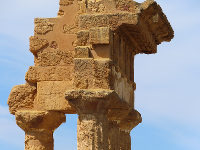
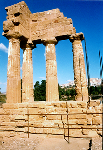
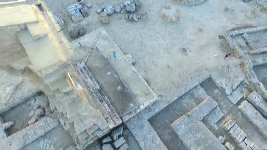
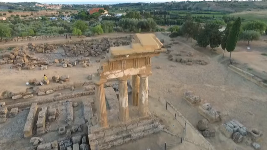
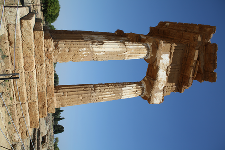
...
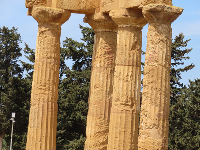
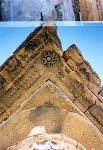
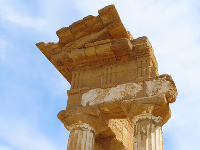
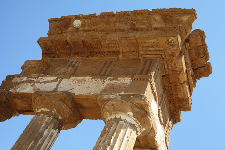
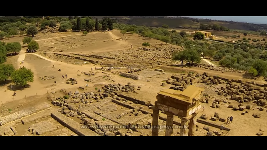

Showing 41 image from /kaggle/working/image-matching-challenge-2024/test/church/images


In [ ]:
if DEBUG:
    for dirIdx in range(len(imagesDirList_test)):
        src = imagesDirList_test[dirIdx]
        images = [cv2.cvtColor(cv2.imread(im), cv2.COLOR_BGR2RGB) for im in glob(f'{src}/*')]
        print(f'Showing {len(images)} image from {src}')
        media.show_images(images, height=300, columns=5)

## Create a Torch Dataset
In order to pass that data as input to the NN, we needed to convert to tensor and apply some transforms. I decided create a torch dataset that will iterate through the images in a given folder.

In [ ]:
import torch
from torch.utils.data import Dataset
from torchvision.io import read_image

class IMC2024TestSet(Dataset):
    def __init__(self, imgDir, transform=None):
        #this is the scene folder
        self.imgDir = imgDir
        self.transform = transform
        self.imgPathList = [imgPath for imgPath in glob(f'{imgDir}/*')]

    def __len__(self):
        return len(self.imgPathList)

    def __getitem__(self, idx):
        imgPath = self.imgPathList[idx]
        image = read_image(imgPath)
        if self.transform:
            image = self.transform(image)
        return imgPath, image

In [ ]:
from torchvision import transforms as T

transform = T.Compose([
    T.Resize((224, 224)),
    T.ConvertImageDtype(torch.float),
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Rotation Correction
In this section, we correct the rotation of the images.

/opt/conda/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


0. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0055.png :`s orientation is correct.
1. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0230.png :`s orientation is correct.
2. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/dioscuria_236.png :`s orientation is correct.
3. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/dioscuria_185.png :`s orientation is correct.
4. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1522.png :`s ROTATED.


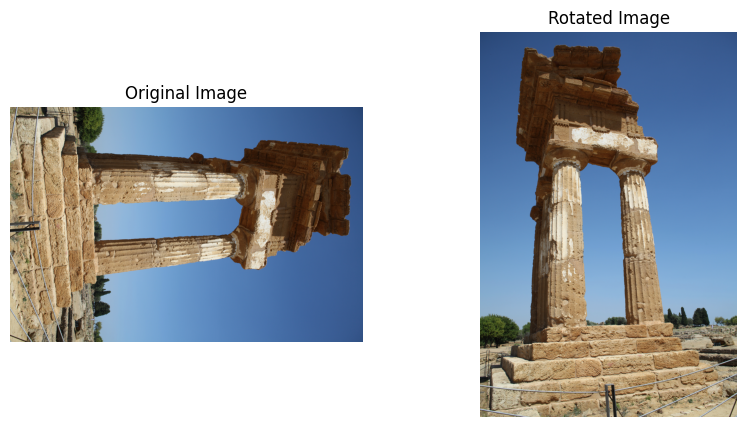

5. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/dioscuria_261.png :`s orientation is correct.
6. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0152.png :`s orientation is correct.
7. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0281.png :`s orientation is correct.
8. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0003.png :`s orientation is correct.
9. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/templia_75.png :`s orientation is correct.
10. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0010.png :`s orientation is correct.
11. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1549.png :`s orientation is correct.
12. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/templic_30.png :`s orientation is correct.
13. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0391.png

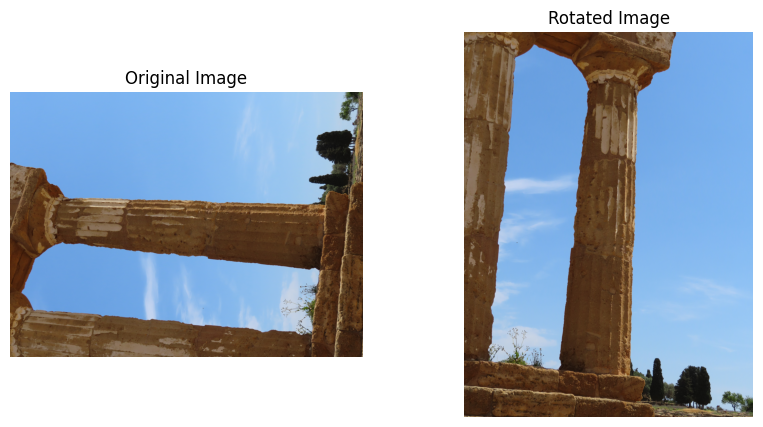

14. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0015.png :`s orientation is correct.
15. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1573.png :`s orientation is correct.
16. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0075.png :`s ROTATED.


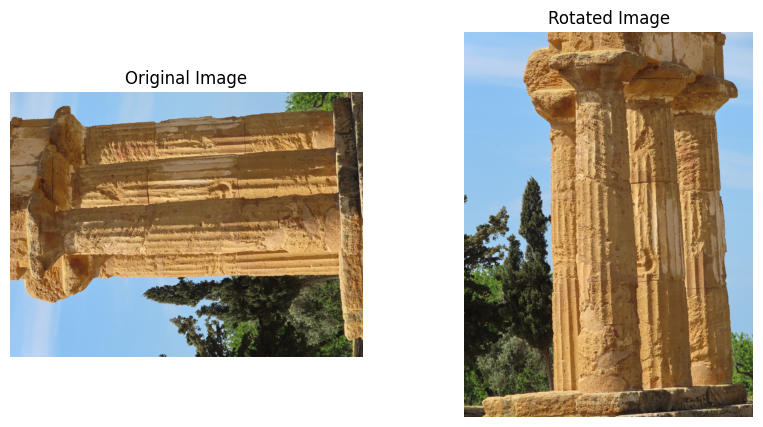

17. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0013.png :`s orientation is correct.
18. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/templia_87.png :`s orientation is correct.
19. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/templia_101.png :`s orientation is correct.
20. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/dioscuria_161.png :`s orientation is correct.
21. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0057.png :`s orientation is correct.
22. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0004.png :`s orientation is correct.
23. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0102.png :`s orientation is correct.
24. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1538.png :`s ROTATED.


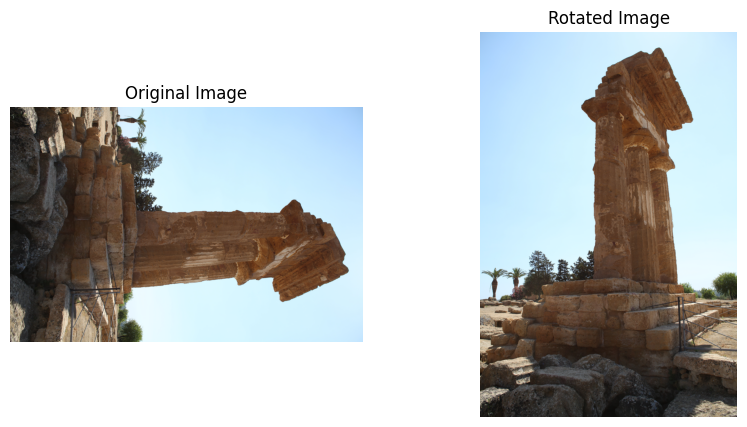

25. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0001.png :`s orientation is correct.
26. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0182.png :`s orientation is correct.
27. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0119.png :`s orientation is correct.
28. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1542.png :`s ROTATED.


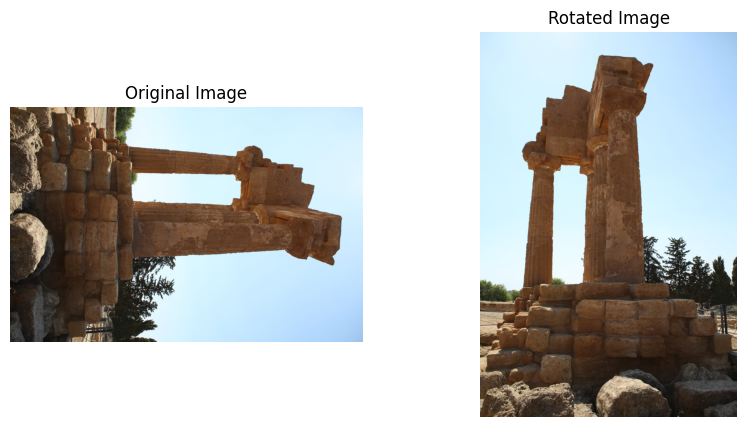

29. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0272.png :`s ROTATED.


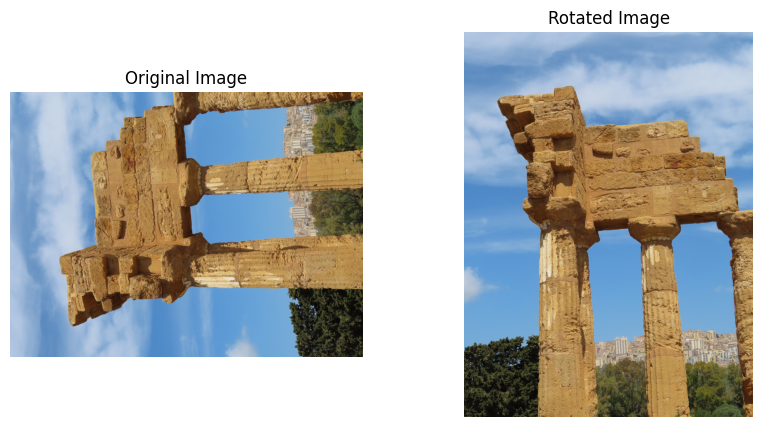

30. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0219.png :`s ROTATED.


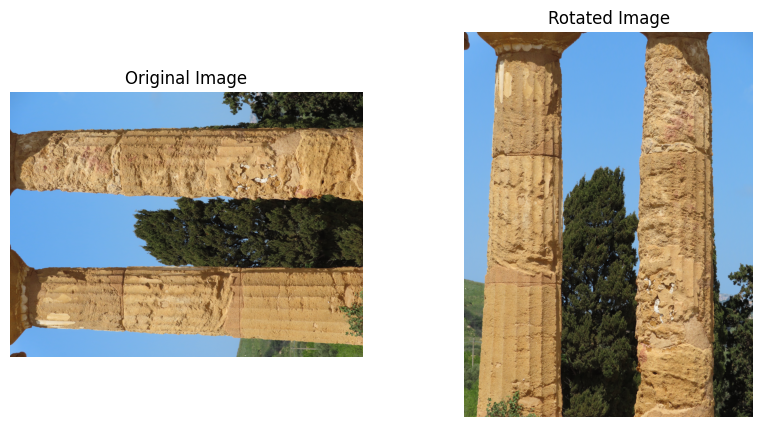

31. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0244.png :`s orientation is correct.
32. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1565.png :`s ROTATED.


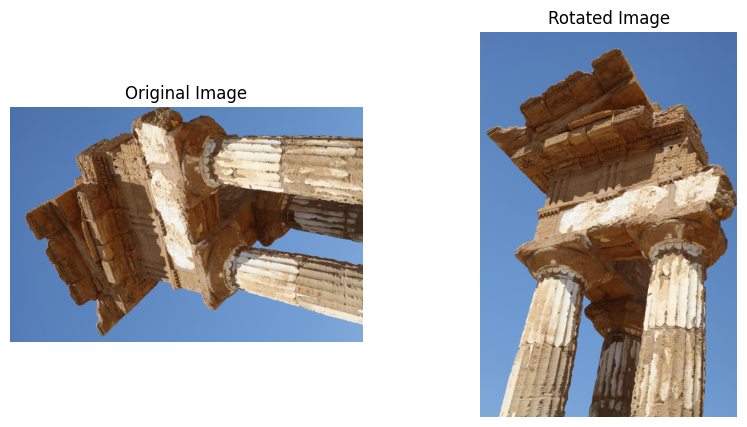

33. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0461.png :`s ROTATED.


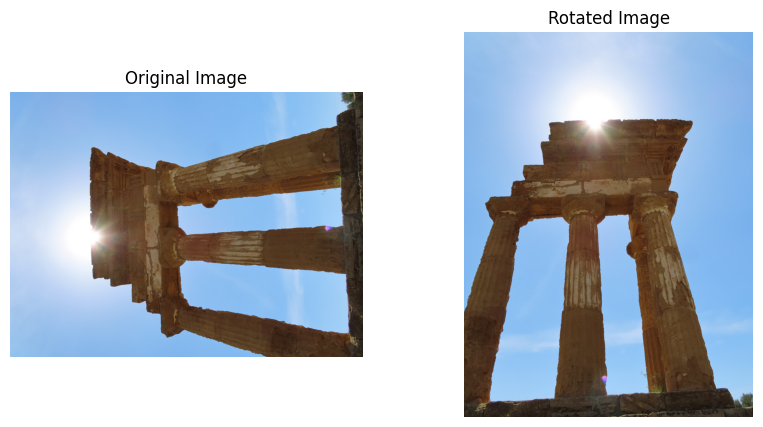

34. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0207.png :`s ROTATED.


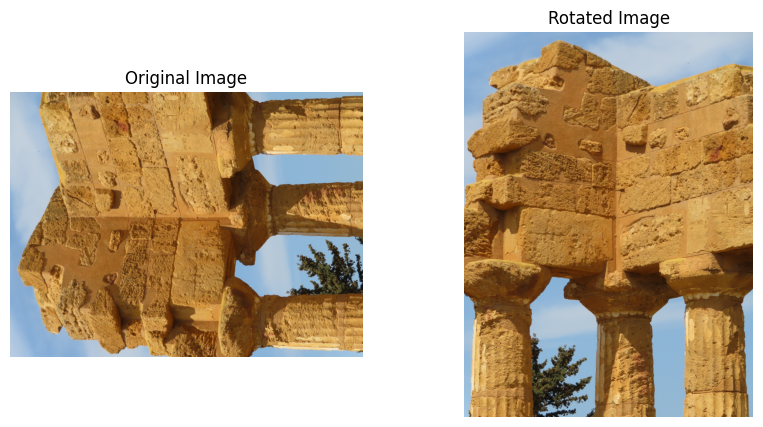

35. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0026.png :`s orientation is correct.
36. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0132.png :`s orientation is correct.
37. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1562.png :`s orientation is correct.
38. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0030.png :`s orientation is correct.
39. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0133.png :`s ROTATED.


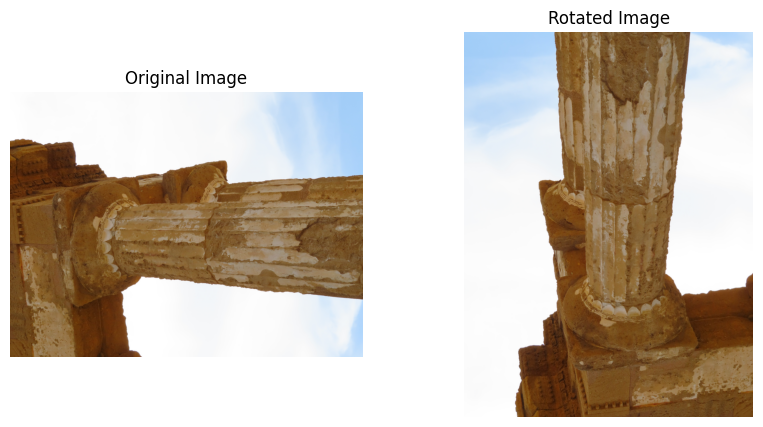

40. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0257.png :`s orientation is correct.
41. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/templia_78.png :`s orientation is correct.
42. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/templic_23.png :`s orientation is correct.
43. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/dioscuria_214.png :`s orientation is correct.
44. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1554.png :`s ROTATED.


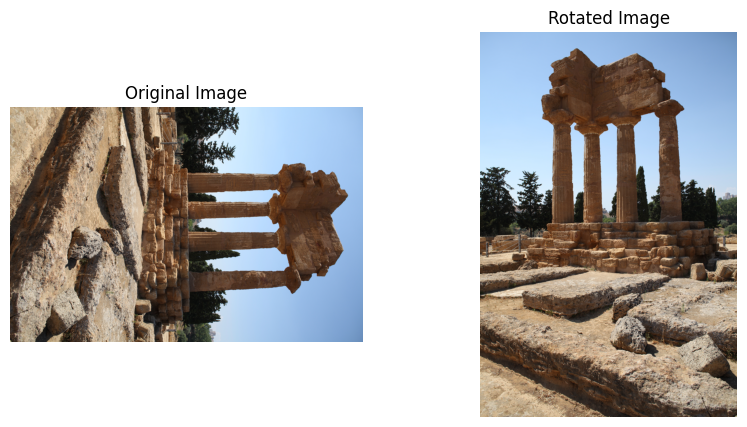

45. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/dioscuria_147.png :`s orientation is correct.
46. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0099.png :`s ROTATED.


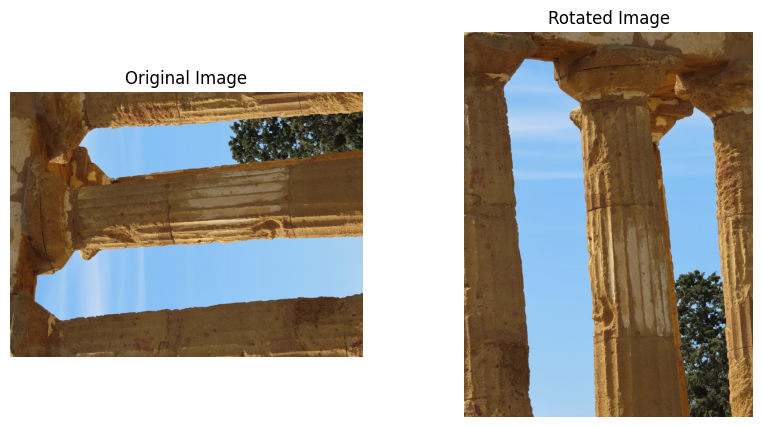

47. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/dioscuria_228.png :`s orientation is correct.
48. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0362.png :`s ROTATED.


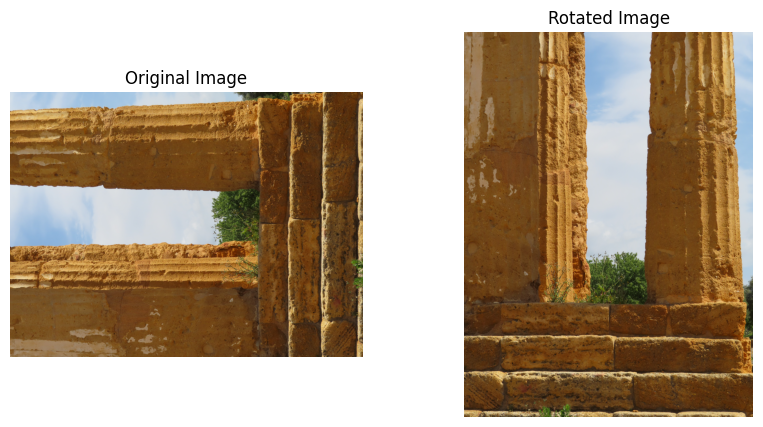

49. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0008.png :`s orientation is correct.
50. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0297.png :`s ROTATED.


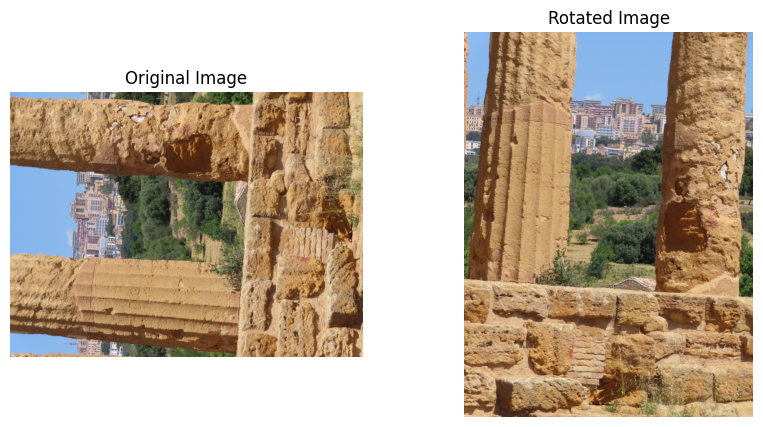

51. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0105.png :`s orientation is correct.
52. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1512.png :`s ROTATED.


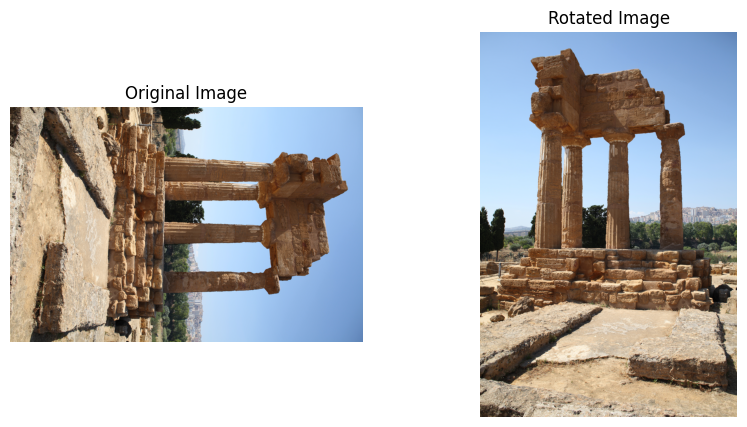

53. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1517.png :`s ROTATED.


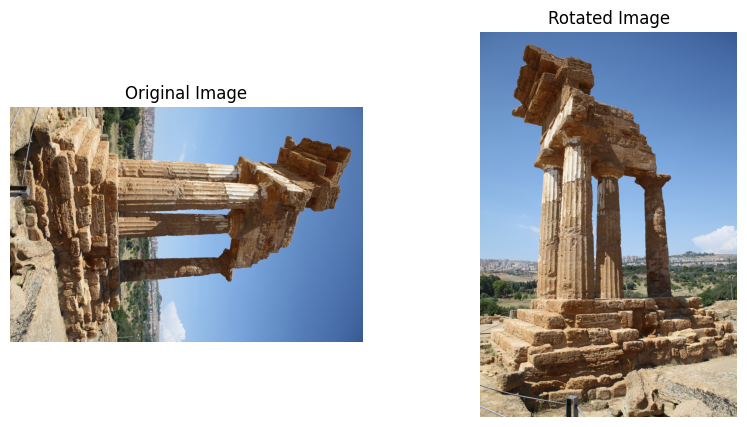

54. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0311.png :`s ROTATED.


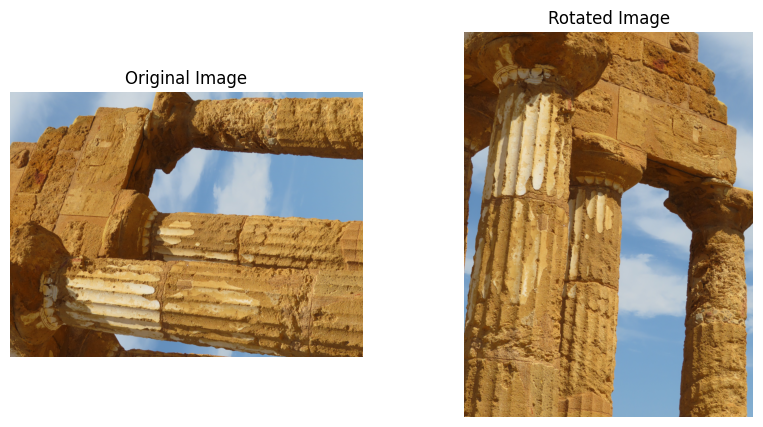

55. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1564.png :`s ROTATED.


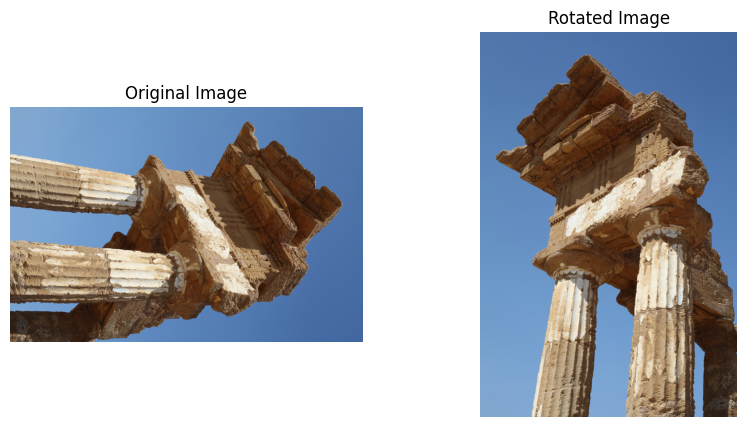

56. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1582.png :`s orientation is correct.
57. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0107.png :`s ROTATED.


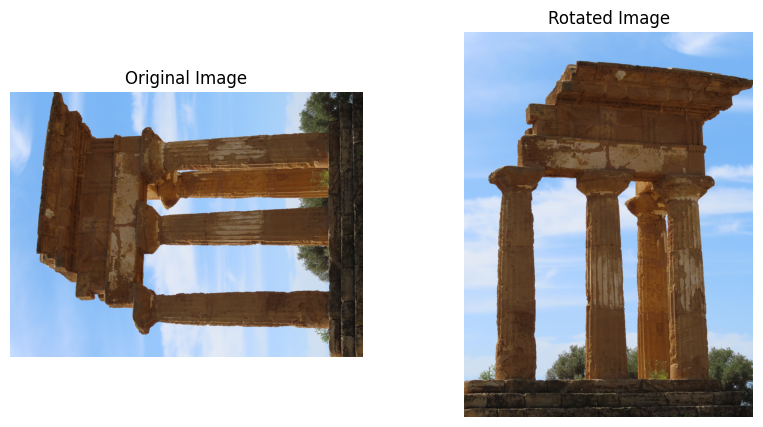

58. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0005.png :`s orientation is correct.
59. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0336.png :`s ROTATED.


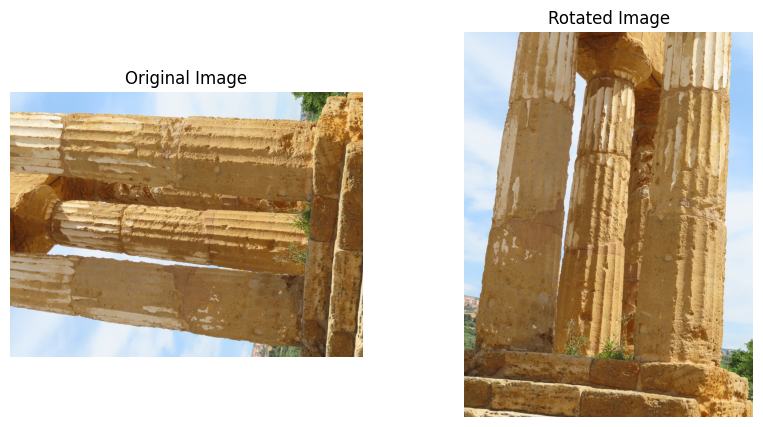

60. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0324.png :`s ROTATED.


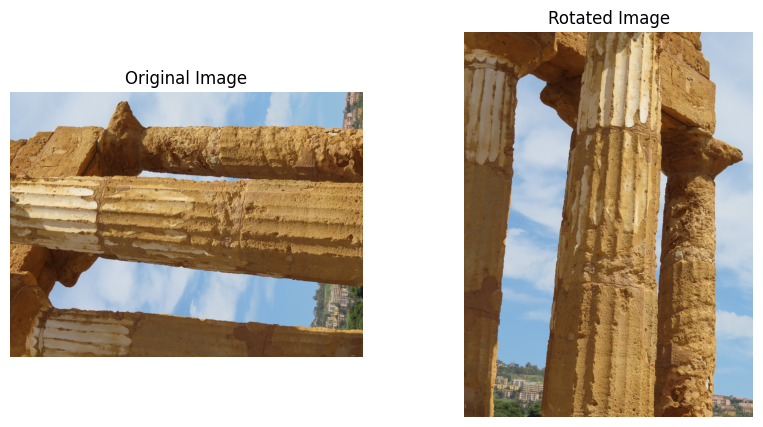

61. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/dioscuria_154.png :`s orientation is correct.
62. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0060.png :`s orientation is correct.
63. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0054.png :`s ROTATED.


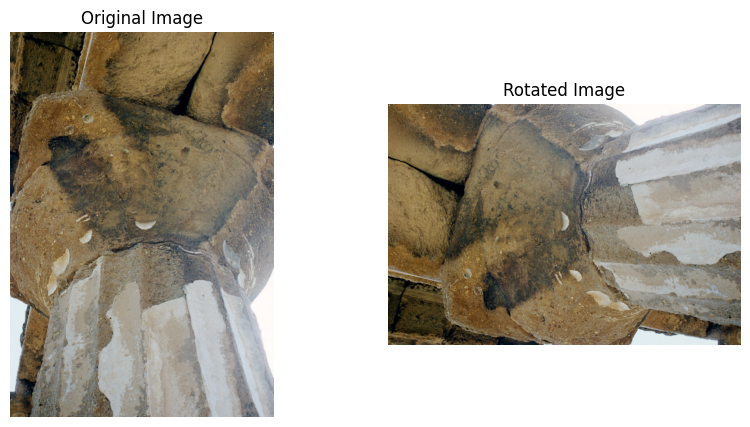

64. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0409.png :`s ROTATED.


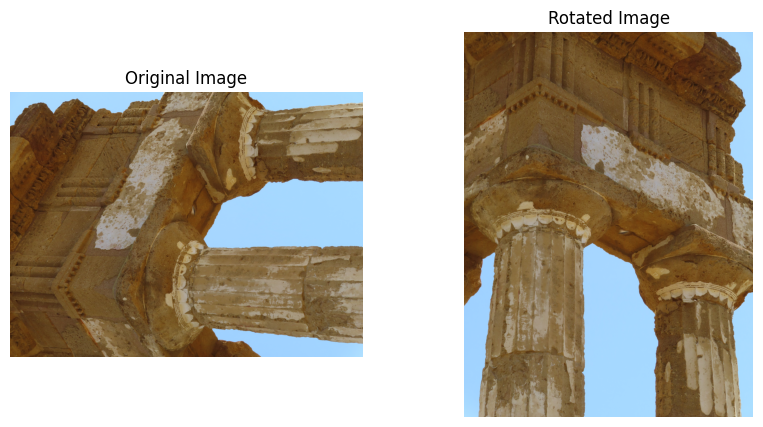

65. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0168.png :`s orientation is correct.
66. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/archive_0025.png :`s orientation is correct.
67. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/img_0353.png :`s orientation is correct.
68. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/3dom_fbk_img_1571.png :`s orientation is correct.
69. /kaggle/working/image-matching-challenge-2024/test/dioscuri/images/templia_94.png :`s orientation is correct.
Total 24 in /kaggle/working/image-matching-challenge-2024/test/dioscuri/images corrected.
0. /kaggle/working/image-matching-challenge-2024/test/church/images/00042.png :`s orientation is correct.
1. /kaggle/working/image-matching-challenge-2024/test/church/images/00008.png :`s orientation is correct.
2. /kaggle/working/image-matching-challenge-2024/test/church/images/00069.png :`s orientation is correct.
3. /kaggle/workin

In [ ]:
for sceneDir in imagesDirList_test:

    scene = IMC2024TestSet(sceneDir, transform=transform)
    numberOfImagesRotated = 0

    for idx, out in enumerate(scene):
        imgPath, image = out
#         print(f'{idx}')
#         print(f'{imgPath}')

#         if DEBUG:
#             # Load and display the image using Matplotlib
#             img = mpimg.imread(imgPath)
#             plt.imshow(img)
#             plt.axis('off')  # Hide axes
#             plt.show()

        with torch.no_grad():
            prediction = model(image[None, ...]).numpy()[0]

        predictedRotationDeg = 360 - (prediction.argmax() * 90)

        if predictedRotationDeg == 360:
            print(f'{idx}. {imgPath} :`s orientation is correct.')
        else:
            # Read the image
            print(f'{idx}. {imgPath} :`s ROTATED.')
            numberOfImagesRotated += 1

            # Open the PNG image
            image = Image.open(imgPath)
            # Rotate the image by "predictedRotationDeg" (90 180 270) degrees clockwise (use expand=True to avoid cropping)
            rotated_image = image.rotate(predictedRotationDeg, expand=True)
            if DEBUG:
                # Display both the original and rotated images using Matplotlib
                fig, axes = plt.subplots(1, 2, figsize=(10, 5))

                # Display original image
                axes[0].imshow(image)
                axes[0].set_title("Original Image")
                axes[0].axis('off')

                # Display rotated image
                axes[1].imshow(rotated_image)
                axes[1].set_title("Rotated Image")
                axes[1].axis('off')

                plt.show()
            # Save the rotated image to the same path to overwrite the original image
            rotated_image.save(imgPath)

    print(f"Total {numberOfImagesRotated} in {sceneDir} corrected.")

PROBLEMS: the models must be downloaded from github (the .tar file) so i will download it to kaggle manueallly instead and define anew fn to use it.
